In [103]:
import os, glob, json
import pandas as pd
from matplotlib import pyplot as plt
import cv2
from tqdm.notebook import tqdm

def trans(x): # relu
    return 0 if x<0 else x
    
def bb_yolo2pixel(x, y, w, h, scale_w, scale_h): # yolo2coco, output: (xmin, ymin, w, h)
    w = w * scale_w
    h = h * scale_h
    x = (x * scale_w) - (w/2)
    y = (y * scale_h) - (h/2)
    w = trans(int(w+0.5))
    h = trans(int(h+0.5))
    x = trans(int(x+0.5))
    y = trans(int(y+0.5))
    return x, y, w, h

def get_boxes_by_threshold(f, th, scale_w, scale_h): # txtPath, confidence threshold, img.width, img.height # coco2voc, output: (xmin,ymin,xmax,ymax)
    f_boxes = []
    with open(f) as fp:
        lines = fp.readlines()
        for line in lines:
            #print(line)
            x = float(line.split(' ')[1])
            y = float(line.split(' ')[2])
            w = float(line.split(' ')[3])
            h = float(line.split(' ')[4])
            confidence = float(line.split(' ')[5])
            if confidence > th:
                x, y, w, h = bb_yolo2pixel(x, y, w, h, scale_w, scale_h)
                #print(x, y, x+w, y+h)
                box = list([x, y, x+w, y+h])
                f_boxes.append(box)
    return f_boxes

def bb_intersection_over_union(boxA, boxB): # get IOU of 
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou

def get_boxes_by_iou(boxesA, boxesB, iou_th): # vocBoxesA, vocBoxesB, iou_th=0.5 # output: singles of A, pairs of (A,B)
    boxes_single = []
    boxes_pair = []
    for boxA in boxesA:
        # print(boxA)
        match = False
        for boxB in boxesB:
            iou = bb_intersection_over_union(boxA, boxB)
            if iou > iou_th: # matching threshold
                match = True
                # print(boxA, boxB)
                boxes_pair.append(boxes_avg(boxA, boxB))
                break
        if not match:
            boxes_single.append(boxA)
    return boxes_single, boxes_pair

def get_lists_intersection(listA, listB):
    return [element for element in listA if element in listB]

def boxes_avg(boxA, boxB):
    return [round((g + h) / 2) for g, h in zip(boxA, boxB)]

def draw_boxes_w_color(im, boxes, color, line_width=2):
    for box in boxes:
        x1, y1, x2, y2 = box
        cv2.rectangle(im, (x1, y1), (x2, y2), color, line_width)

In [130]:
class Compare:
    def __init__(self, txtFolder1, txtFolder2, txtFolder3, imgFolder, conf_th=0.9, iou_th=0.5):
        assert os.listdir(txtFolder1)==os.listdir(txtFolder2)==os.listdir(txtFolder3)
        # get D
        cachePath = f"{txtFolder1}/../.cache.json"
        if glob.glob(cachePath):
            self.D = json.load(open(cachePath,"r"))
        else:
            self.D = { txtName:{} for txtName in os.listdir(txtFolder1) if ".txt" in txtName }
            img    = cv2.imread( f"{imgFolder}/{next(iter(self.D)).replace('.txt','.jpg')}" )
            scale_h, scale_w, _ = img.shape
            for txtName in self.D.keys():
                # get voc boxes from model results
                self.D[txtName]["f1_boxes"] = get_boxes_by_threshold(f"{txtFolder1}/{txtName}", conf_th, scale_w, scale_h)
                self.D[txtName]["f2_boxes"] = get_boxes_by_threshold(f"{txtFolder2}/{txtName}", conf_th, scale_w, scale_h)
                self.D[txtName]["f3_boxes"] = get_boxes_by_threshold(f"{txtFolder3}/{txtName}", conf_th, scale_w, scale_h)
                # get (relative) single and pair from vocboxes and iou_th=0.5
                f12_single, f12_pair = get_boxes_by_iou(self.D[txtName]["f1_boxes"], self.D[txtName]["f2_boxes"], iou_th)
                f13_single, f13_pair = get_boxes_by_iou(self.D[txtName]["f1_boxes"], self.D[txtName]["f3_boxes"], iou_th)
                f21_single, f21_pair = get_boxes_by_iou(self.D[txtName]["f2_boxes"], self.D[txtName]["f1_boxes"], iou_th)
                f23_single, f23_pair = get_boxes_by_iou(self.D[txtName]["f2_boxes"], self.D[txtName]["f3_boxes"], iou_th)
                f31_single, f31_pair = get_boxes_by_iou(self.D[txtName]["f3_boxes"], self.D[txtName]["f1_boxes"], iou_th)
                f32_single, f32_pair = get_boxes_by_iou(self.D[txtName]["f3_boxes"], self.D[txtName]["f2_boxes"], iou_th)
                # get (absolute) single for each model
                self.D[txtName]["f1_boxes_single"] = get_lists_intersection(f12_single, f13_single)
                self.D[txtName]["f2_boxes_single"] = get_lists_intersection(f21_single, f23_single)
                self.D[txtName]["f3_boxes_single"] = get_lists_intersection(f31_single, f32_single)
                # get (absolute) missing for each model
                self.D[txtName]["f1_boxes_missing"] = get_boxes_by_iou(f23_pair, self.D[txtName]["f1_boxes"], iou_th)[0]
                self.D[txtName]["f2_boxes_missing"] = get_boxes_by_iou(f13_pair, self.D[txtName]["f2_boxes"], iou_th)[0]
                self.D[txtName]["f3_boxes_missing"] = get_boxes_by_iou(f12_pair, self.D[txtName]["f3_boxes"], iou_th)[0]
            json.dump(self.D, open(cachePath,"w"))
        # get df
        self.df = { "file":[], "FasterRCNN_single":[], "YoloR_single":[], "YOLOv7_single":[], "FasterRCNN_missing":[], "YoloR_missing":[], "YOLOv7_missing":[] }
        for txtName in self.D.keys():
            self.df["file"].append( txtName.replace('.txt','.jpg') )
            self.df["FasterRCNN_single"].append(  len(self.D[txtName]['f1_boxes_single'])  )
            self.df["YoloR_single"].append(       len(self.D[txtName]['f2_boxes_single'])  )
            self.df["YOLOv7_single"].append(      len(self.D[txtName]['f3_boxes_single'])  )
            self.df["FasterRCNN_missing"].append( len(self.D[txtName]['f1_boxes_missing']) )
            self.df["YoloR_missing"].append(      len(self.D[txtName]['f2_boxes_missing']) )
            self.df["YOLOv7_missing"].append(     len(self.D[txtName]['f3_boxes_missing']) )
        self.df = pd.DataFrame(self.df)
        #
        self.csvPath   = f"{txtFolder1}/../compare.csv"
        self.imgFolder = imgFolder
    
    def saveCsv(self):
        self.df.to_csv( self.csvPath, index=False )
    
    def plot(self, txtName, mode):
        img = cv2.imread( f"{self.imgFolder}/{txtName.replace('.txt','.jpg')}" )
        #print(self.D[txtName])
        if mode=="predict":
            draw_boxes_w_color(img, self.D[txtName]["f1_boxes"], (255, 255, 0), line_width=2) # img, boxes, color, line_width=2
            draw_boxes_w_color(img, self.D[txtName]["f2_boxes"], (0, 255, 255), line_width=2)
            draw_boxes_w_color(img, self.D[txtName]["f3_boxes"], (255, 0, 255), line_width=2)
        elif mode=="single": 
            draw_boxes_w_color(img, self.D[txtName]["f1_boxes_single"], (255, 255, 0), line_width=2)
            draw_boxes_w_color(img, self.D[txtName]["f2_boxes_single"], (0, 255, 255), line_width=2)
            draw_boxes_w_color(img, self.D[txtName]["f3_boxes_single"], (255, 0, 255), line_width=2)
        elif mode=="missing":
            draw_boxes_w_color(img, self.D[txtName]["f1_boxes_missing"], (255, 255, 0), line_width=2)
            draw_boxes_w_color(img, self.D[txtName]["f2_boxes_missing"], (0, 255, 255), line_width=2)
            draw_boxes_w_color(img, self.D[txtName]["f3_boxes_missing"], (255, 0, 255), line_width=2)
        else:
            raise BaseException(f"mode must in ['predict','single','missing'], but get {mode}")
        font = cv2.FONT_HERSHEY_SIMPLEX
        fontScale = 0.6
        color = (255, 255, 255) # BGR
        thickness = 1 # Line thickness of 2 px 
        cv2.rectangle(img, (32, 39), (42, 49), (255, 255, 0), 2)#, cv2.LINE_AA) # light-blue
        cv2.putText(img, 'Faster RCNN', (50, 50), font, fontScale, color, thickness, cv2.LINE_AA)
        cv2.rectangle(img, (32+170, 39), (42+170, 49), (0, 255, 255), 2)#, cv2.LINE_AA) # yellow
        cv2.putText(img, 'YoloR', (50+170, 50), font, fontScale, color, thickness, cv2.LINE_AA)
        cv2.rectangle(img, (32+270, 39), (42+270, 49), (255, 0, 255), 2)#, cv2.LINE_AA) # purple
        cv2.putText(img, 'YOLOv7', (50+270, 50), font, fontScale, color, thickness, cv2.LINE_AA)
        plt.figure(figsize=(26, 20), dpi=80)
        plt.imshow(img[:,:,::-1])
        plt.show()
        
    def rankPlot(self):
        self.df['overall_single' ] = self.df[["FasterRCNN_single",  "YoloR_single",  "YOLOv7_single" ]].sum(axis=1)
        self.df['overall_missing'] = self.df[["FasterRCNN_missing", "YoloR_missing", "YOLOv7_missing"]].sum(axis=1)
        single_df  = self.df[['file','overall_single' ]].sort_values(by=['overall_single' ], ascending=False).reset_index(drop=True)
        missing_df = self.df[['file','overall_missing']].sort_values(by=['overall_missing'], ascending=False).reset_index(drop=True)
        print(single_df)
        print(missing_df)
        print('-'*10+"single"+'-'*10)
        for i in range(3):
            print( self.D[single_df['file'][i].replace('.jpg','.txt')] )
            self.plot( single_df['file'][i].replace('.jpg','.txt'), "single")
        print('-'*10+"missing"+'-'*10)
        for i in range(3):
            print( self.D[missing_df['file'][i].replace('.jpg','.txt')] )
            self.plot( missing_df['file'][i].replace('.jpg','.txt'), "missing")

                         file  overall_single
0     20220707_154707_156.jpg               7
1     20220707_154706_154.jpg               6
2     20220707_154648_828.jpg               6
3     20220707_154708_159.jpg               6
4     20220707_154701_955.jpg               6
...                       ...             ...
3160  20220707_140453_917.jpg               0
3161  20220707_154729_555.jpg               0
3162  20220707_154808_601.jpg               0
3163  20220707_154320_574.jpg               0
3164  20220707_154357_554.jpg               0

[3165 rows x 2 columns]
                         file  overall_missing
0     20220707_154702_959.jpg                9
1     20220707_154640_755.jpg                9
2     20220707_154703_359.jpg                8
3     20220707_154640_956.jpg                8
4     20220707_154703_161.jpg                8
...                       ...              ...
3160  20220707_140543_912.jpg                0
3161  20220707_140618_316.jpg                0


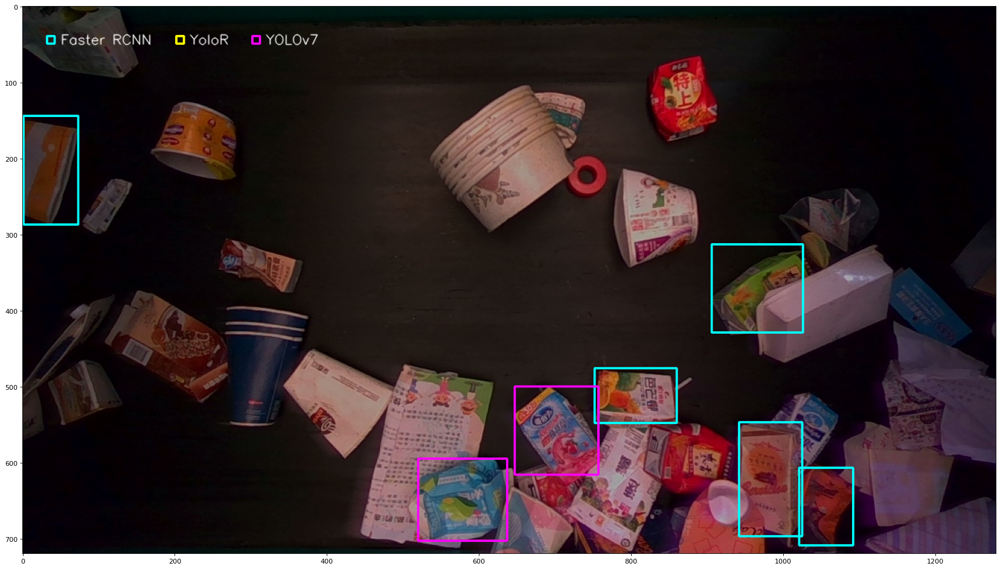

{'f1_boxes': [[749, 299, 861, 370], [609, 371, 766, 522], [451, 517, 506, 588], [285, 336, 417, 437], [255, 448, 346, 529], [1168, 605, 1274, 681]], 'f2_boxes': [], 'f3_boxes': [[748, 300, 862, 374], [1015, 598, 1149, 707]], 'f1_boxes_single': [[609, 371, 766, 522], [451, 517, 506, 588], [285, 336, 417, 437], [255, 448, 346, 529], [1168, 605, 1274, 681]], 'f2_boxes_single': [], 'f3_boxes_single': [[1015, 598, 1149, 707]], 'f1_boxes_missing': [], 'f2_boxes_missing': [[748, 300, 862, 372]], 'f3_boxes_missing': []}


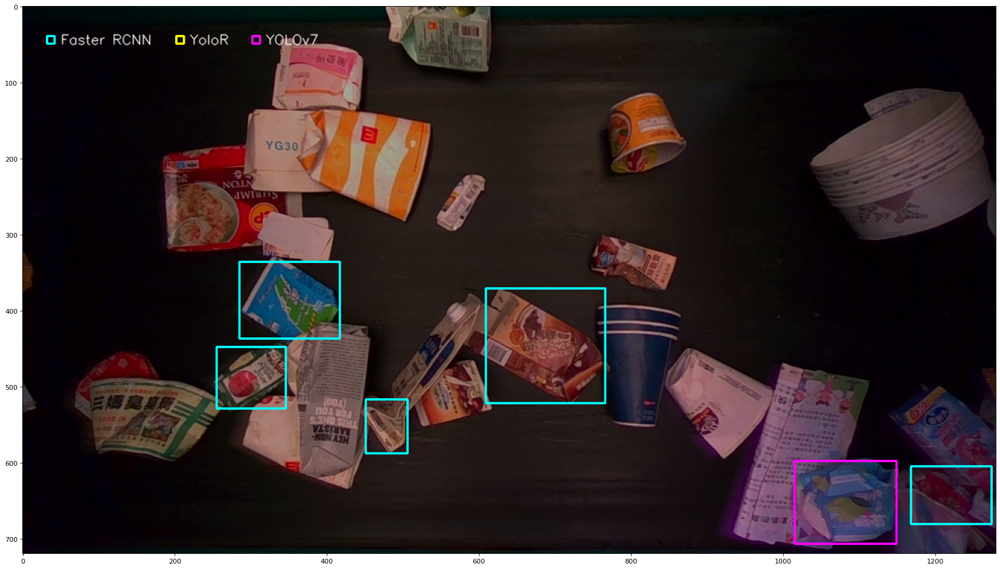

{'f1_boxes': [[1148, 445, 1269, 576], [194, 432, 336, 568]], 'f2_boxes': [], 'f3_boxes': [[999, 578, 1111, 684], [1194, 345, 1280, 431], [1135, 564, 1239, 705], [1150, 445, 1266, 577], [335, 0, 453, 153], [1236, 587, 1280, 673]], 'f1_boxes_single': [[194, 432, 336, 568]], 'f2_boxes_single': [], 'f3_boxes_single': [[999, 578, 1111, 684], [1194, 345, 1280, 431], [1135, 564, 1239, 705], [335, 0, 453, 153], [1236, 587, 1280, 673]], 'f1_boxes_missing': [], 'f2_boxes_missing': [[1149, 445, 1268, 576]], 'f3_boxes_missing': []}


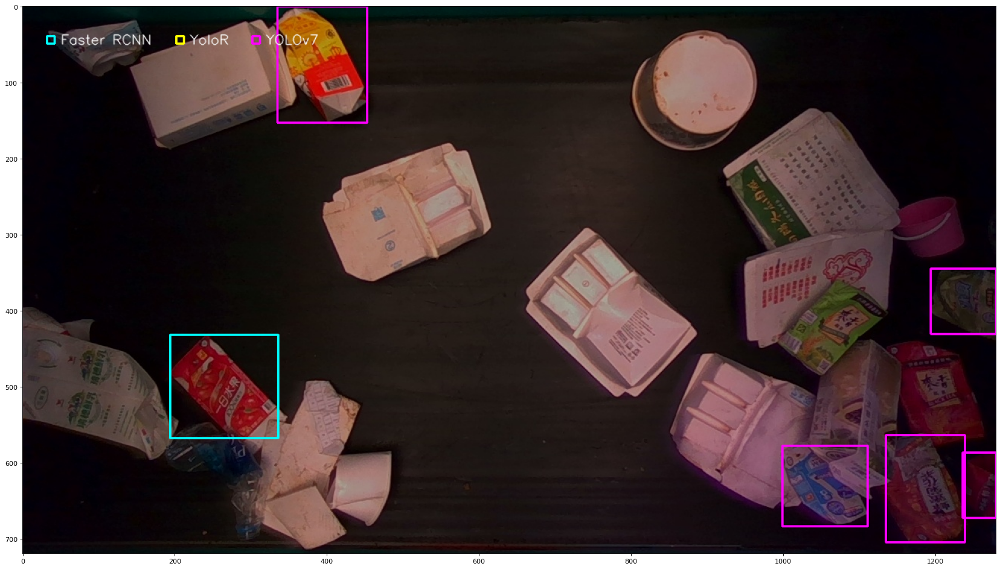

----------missing----------
{'f1_boxes': [[600, 545, 728, 716], [754, 387, 865, 460], [550, 2, 673, 124], [753, 290, 894, 397], [838, 134, 938, 270], [470, 526, 576, 609], [1175, 184, 1280, 296], [944, 316, 1076, 395], [332, 405, 472, 478]], 'f2_boxes': [], 'f3_boxes': [[935, 314, 1079, 400], [839, 135, 936, 271], [0, 474, 132, 601], [1174, 185, 1280, 295], [756, 289, 894, 403], [550, 0, 674, 124], [469, 525, 575, 611], [882, 376, 1019, 468], [753, 386, 864, 465], [598, 549, 726, 716], [334, 400, 471, 481]], 'f1_boxes_single': [], 'f2_boxes_single': [], 'f3_boxes_single': [[0, 474, 132, 601], [882, 376, 1019, 468]], 'f1_boxes_missing': [], 'f2_boxes_missing': [[599, 547, 727, 716], [754, 386, 864, 462], [550, 1, 674, 124], [754, 290, 894, 400], [838, 134, 937, 270], [470, 526, 576, 610], [1174, 184, 1280, 296], [940, 315, 1078, 398], [333, 402, 472, 480]], 'f3_boxes_missing': []}


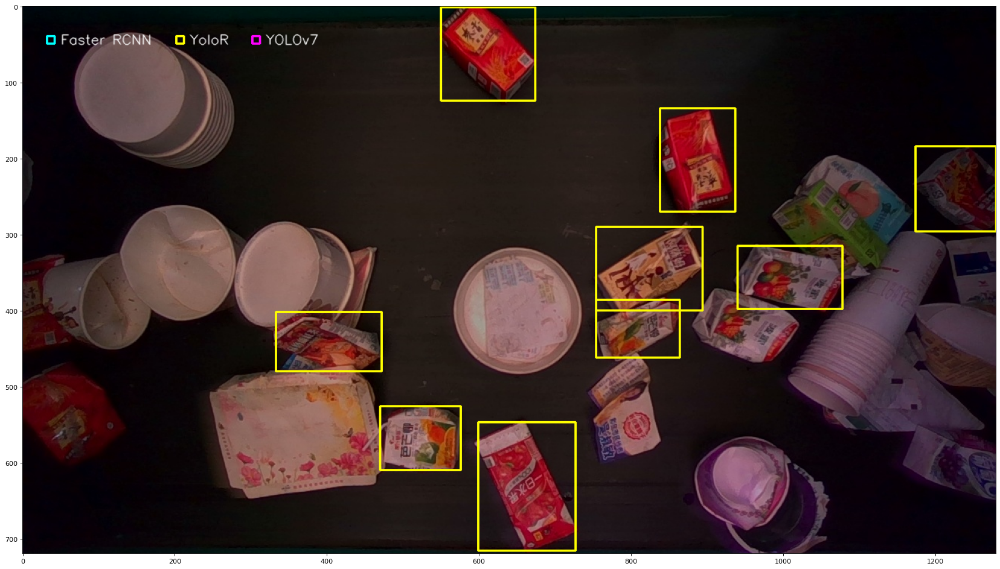

{'f1_boxes': [[305, 125, 387, 264], [902, 183, 1027, 256], [1059, 166, 1157, 281], [789, 217, 881, 327], [1066, 546, 1229, 657], [879, 430, 1003, 570], [1044, 437, 1177, 538], [484, 365, 583, 482], [552, 186, 651, 287], [291, 296, 372, 440], [472, 149, 564, 250]], 'f2_boxes': [[900, 182, 1028, 256]], 'f3_boxes': [[1060, 166, 1158, 282], [876, 433, 1002, 571], [304, 127, 389, 265], [789, 213, 885, 324], [899, 183, 1022, 255], [1068, 547, 1228, 653], [478, 366, 581, 488], [551, 185, 657, 286], [435, 262, 555, 343], [1046, 438, 1174, 537], [290, 298, 374, 442]], 'f1_boxes_single': [[472, 149, 564, 250]], 'f2_boxes_single': [], 'f3_boxes_single': [[435, 262, 555, 343]], 'f1_boxes_missing': [], 'f2_boxes_missing': [[304, 126, 388, 264], [1060, 166, 1158, 282], [789, 215, 883, 326], [1067, 546, 1228, 655], [878, 432, 1002, 570], [1045, 438, 1176, 538], [481, 366, 582, 485], [552, 186, 654, 286], [290, 297, 373, 441]], 'f3_boxes_missing': []}


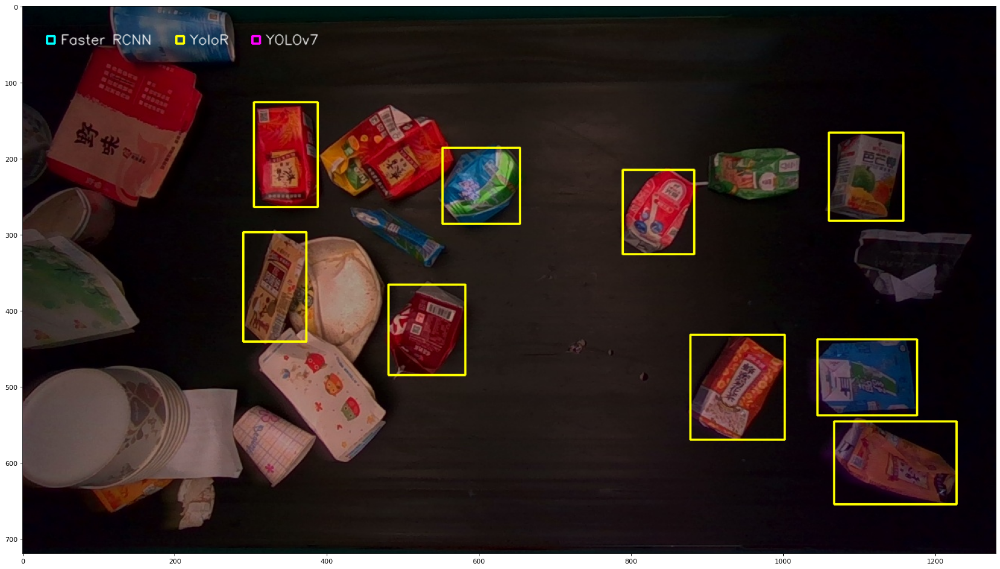

{'f1_boxes': [[406, 542, 532, 716], [273, 524, 384, 608], [554, 291, 694, 397], [552, 388, 666, 461], [638, 134, 733, 272], [977, 186, 1099, 298], [355, 1, 482, 127], [964, 555, 1102, 650], [752, 316, 866, 398], [1091, 261, 1180, 331], [686, 373, 808, 467]], 'f2_boxes': [[974, 184, 1106, 300], [352, 0, 484, 132]], 'f3_boxes': [[639, 137, 731, 272], [744, 316, 870, 404], [957, 555, 1101, 651], [980, 188, 1102, 297], [356, 1, 479, 127], [273, 524, 384, 609], [556, 292, 693, 401], [407, 549, 532, 714], [549, 386, 665, 465], [688, 372, 810, 465]], 'f1_boxes_single': [[1091, 261, 1180, 331]], 'f2_boxes_single': [], 'f3_boxes_single': [], 'f1_boxes_missing': [], 'f2_boxes_missing': [[406, 546, 532, 715], [273, 524, 384, 608], [555, 292, 694, 399], [550, 387, 666, 463], [638, 136, 732, 272], [960, 555, 1102, 650], [748, 316, 868, 401], [687, 372, 809, 466]], 'f3_boxes_missing': []}


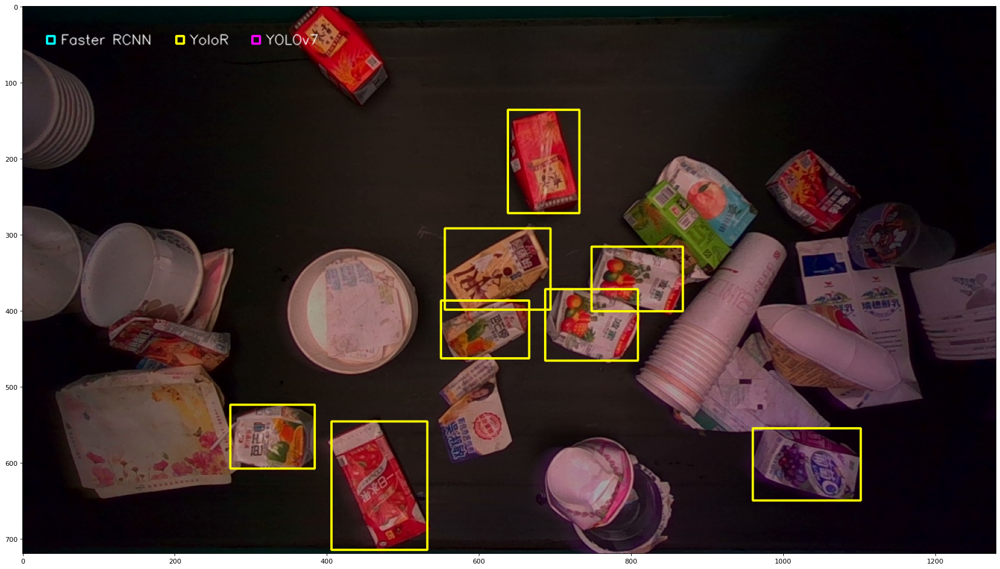

In [131]:
obj = Compare( *[ f"../_compare/0707_special/{model}" for model in ["maskRCNN","yolor_0707","yoloFormat"] ], \
                f"/home/jovyan/data-vol-2/recycling/backboneData/2022-07-07" )
#obj.saveCsv()
obj.rankPlot()

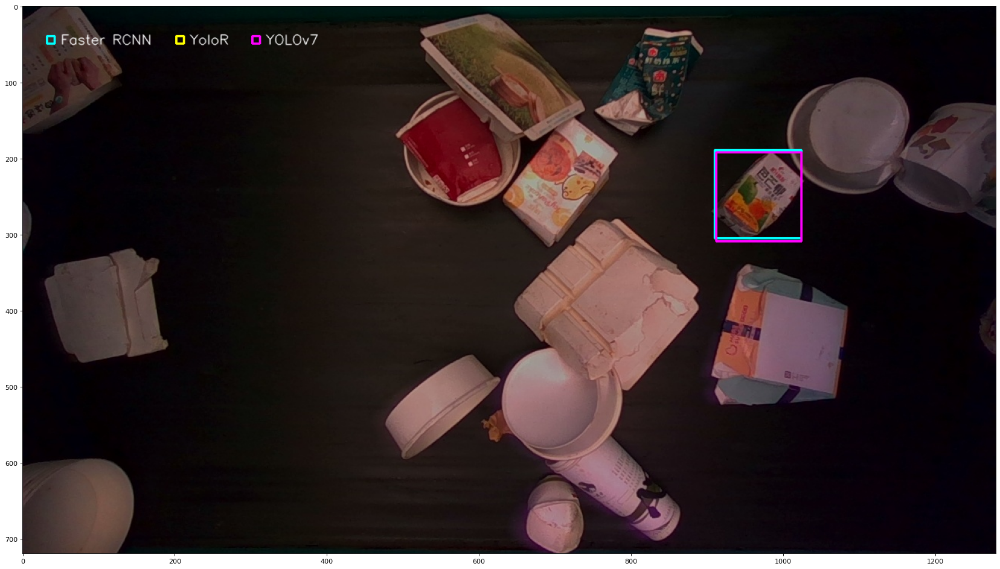

In [109]:
obj.plot("20220707_154253_159.txt", "predict")

In [110]:
obj.df

,file,FasterRCNN_single,YoloR_single,YOLOv7_single,FasterRCNN_missing,YoloR_missing,YOLOv7_missing
0,20220707_140626_914.jpg,1,0,0,0,0,0
1,20220707_154243_357.jpg,0,0,0,0,0,0
2,20220707_154752_156.jpg,0,0,0,0,1,0
3,20220707_154624_156.jpg,0,0,0,0,0,0
4,20220707_140500_111.jpg,0,0,1,0,0,0
...,...,...,...,...,...,...,...
3160,20220707_154254_556.jpg,0,0,0,0,1,0
3161,20220707_154210_360.jpg,1,0,1,0,0,0
3162,20220707_154601_359.jpg,0,0,0,0,1,0
3163,20220707_154559_756.jpg,0,0,0,0,0,0
